#### import libraries

In [1]:
import numpy as np
from matplotlib.image import imread
import matplotlib.pyplot as plt
from skimage.segmentation import (morphological_chan_vese,
                                  checkerboard_level_set)
%matplotlib inline

### load image

In [2]:
#img_path0="/Users/yw18581/Documents/UoB_MAPS_Documents/Notebooks_pro/File_0.tiff"
#img_path1="/Users/yw18581/Documents/UoB_MAPS_Documents/Notebooks_pro/File_1.tiff"
img_path1 = "/Users/cdesio/UoB/Jordan/10x10_25mm_v1/File_1.tiff"
#image0 = imread (img_path0)
image1 = imread (img_path1)

### calculate contour using scikit-image `morphological_chan_vese`

In [3]:
def calculate_profile(image):
    # Initial level set
    init_ls =  checkerboard_level_set(image.shape, 5)
    # List with intermediate results for plotting the evolution

    ls = morphological_chan_vese(image, 20, init_level_set=init_ls, smoothing=4)
    return ls

In [5]:
ls0= calculate_profile(image0)

In [4]:
ls1 = calculate_profile(image1)

In [5]:
### show image and contour
def show_img_cont(image,ls):
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.imshow(image, cmap="gray")
    ax.set_axis_off()
    ax.contour(ls,[0.5], colors='r')
    ax.set_title("Morphological ACWE segmentation", fontsize=12)
    plt.show()
    return
#plt.savefig("try.tiff")#,figsize=(2400/96, 2800/96), dpi=96)



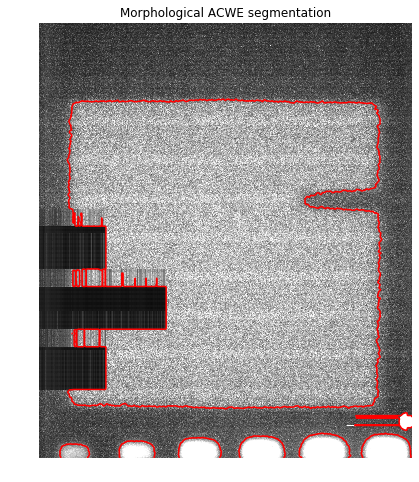

In [9]:
show_img_cont(image0, ls0)

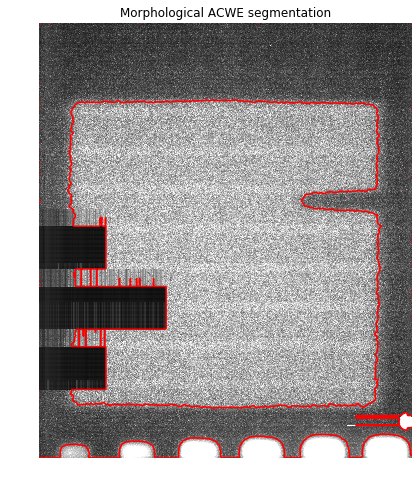

In [6]:
show_img_cont(image1, ls1)

(-100, 3000)

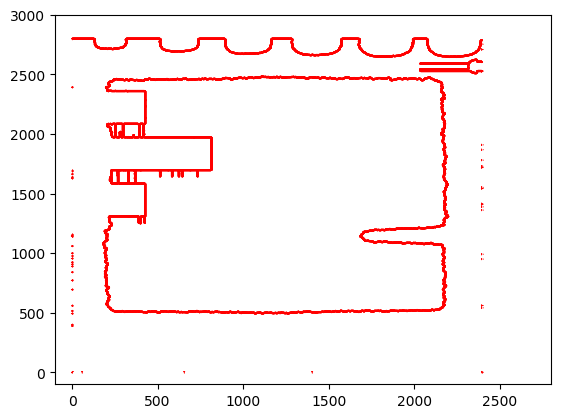

In [7]:
import matplotlib 
matplotlib.rcdefaults() 
#plt.contour(ls0,colors='b')
plt.contour(ls1,colors='r')
plt.xlim(-100,2800)
plt.ylim(-100, 3000)


In [13]:
ls1b=(~ls1.astype(bool)).astype(int)

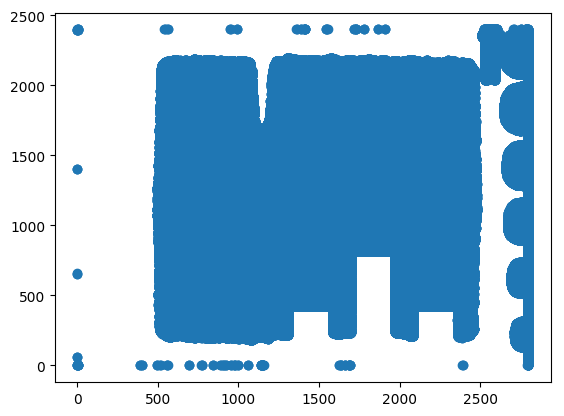

In [87]:
plt.scatter(np.nonzero(ls1b)[0],np.nonzero(ls1b)[1])

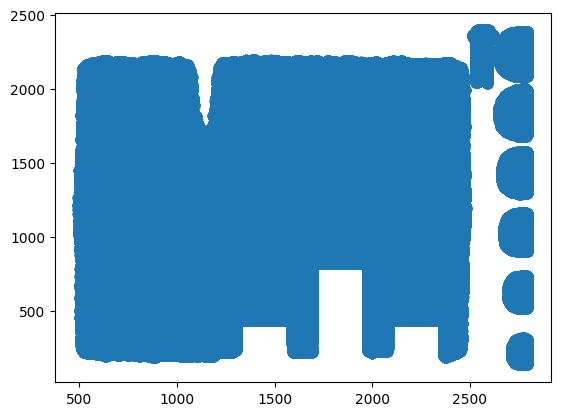

In [84]:
plt.scatter(np.nonzero(ls0)[0],np.nonzero(ls0)[1])

### select leaf from profile

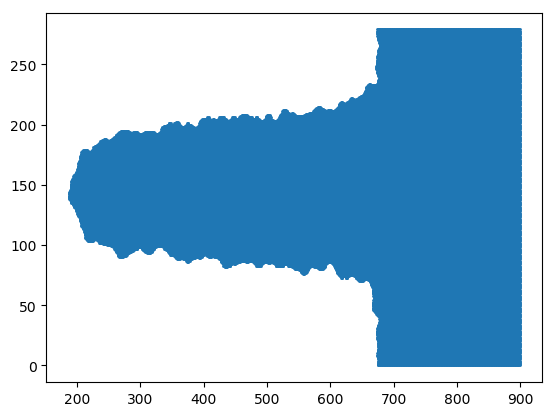

In [8]:
plt.scatter(np.argwhere(ls1[1000:1280,1500:])[:,1],np.argwhere(ls1[1000:1280,1500:])[:,0],s=1)
plt.show()

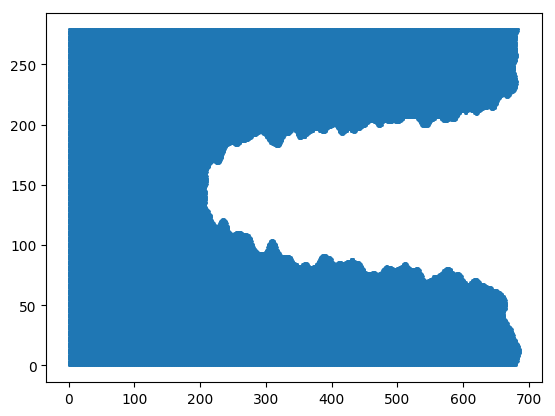

In [70]:
plt.scatter(np.argwhere(ls0[1000:1280,1500:])[:,1],np.argwhere(ls0[1000:1280,1500:])[:,0],s=1)

In [ ]:
g

In [9]:
def select_profile(array):
    sel=[]
    for i in range(np.max(np.argwhere(array)[:,0])):
        sel.append([i,np.max(np.argwhere(array)[:,1][np.argwhere(array)[:,0]==i])])
        #print(i,np.max(np.argwhere(array)[:,1][np.argwhere(array)[:,0]==i]))
    sel = np.asarray(sel)
    return sel

In [1]:
leaf0 = select_profile(ls0[1000:1280])

NameError: name 'select_profile' is not defined

In [10]:
leaf1 = select_profile(ls1[1000:1280,1500:])

In [14]:
leaf1b = select_profile(ls1b[1000:1280])

### plot leaf profile

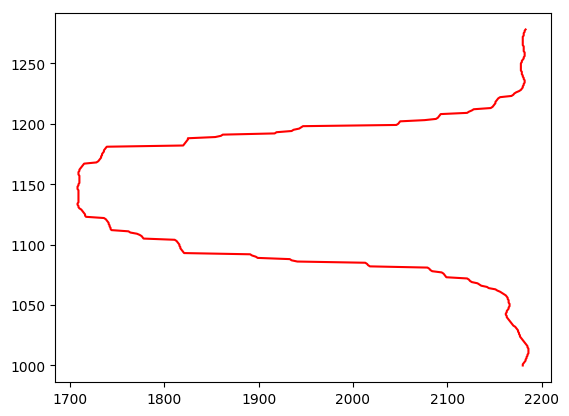

In [25]:
import matplotlib 
#matplotlib.rcdefaults() 
plt.plot(leaf0[:,1], leaf0[:,0]+1000,c='r')

In [16]:
leaf1b.shape

(279, 2)

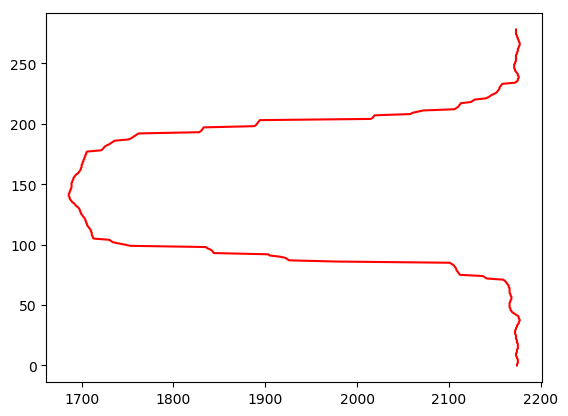

In [15]:
import matplotlib 
matplotlib.rcdefaults() 
plt.plot(leaf1b[:,1], leaf1b[:,0],c='r')

### select leaf on image

In [ ]:
plt.figure(figsize=(10,8))
plt.plot(leaf[:,1], leaf[:,0]+1000,c='r')
fig = plt.imshow(image, cmap="gray")
plt.ylim(2800,0)
plt.xlim(0,2400)
plt.box(False)

fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)
plt.savefig("selected.tiff", transparent=True)

### calculate leaf position as the maximum of the curve

In [15]:
leaf_position = np.min(leaf1b[:,1])
print(leaf_position)

1686


In [16]:
print("The leaf position is: {}".format(leaf_position))

The leaf position is: 1686


In [17]:
ls = ls1b
image=image1

In [ ]:
plt.figure(figsize=(10,8))
plt.scatter(np.argwhere(ls)[:,1],np.argwhere(ls)[:,0] ,c='black',s=1, alpha=0.3)
fig = plt.imshow(image, cmap="gray", alpha=0)
plt.ylim(2800,0)
plt.xlim(0,2400)
fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)



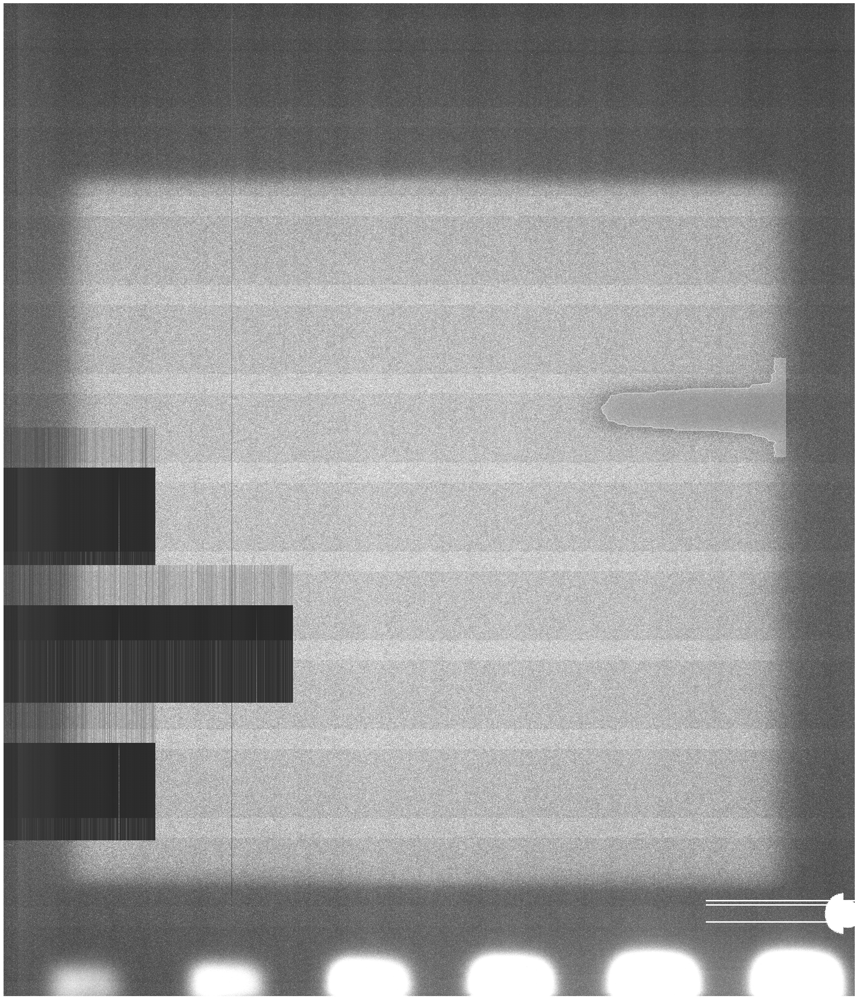

In [18]:
plt.figure(figsize=(2400/96, 2800/96), dpi=96)
plt.style.use('dark_background')
plt.axes([0,0,1,1], frameon=False)
plt.plot(leaf[:,1], leaf[:,0]+1000, c='w', alpha=0.5)
plt.fill_betweenx(leaf[:,0]+1000, leaf[:,1],x2=2205,color='w',alpha=0.3)
fig = plt.imshow(image, cmap="gray", alpha=0.9)
plt.ylim(2800,0)
plt.xlim(0,2400)
plt.box(False)
#plt.tick_params(top=False, bottom=False, left=False, right=False,
#                labelleft=False, labelbottom=False)
fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)
#plt.savefig("mask_on_top_of_the_sensor.tiff")

In [17]:
leaf = leaf1b
image=image1

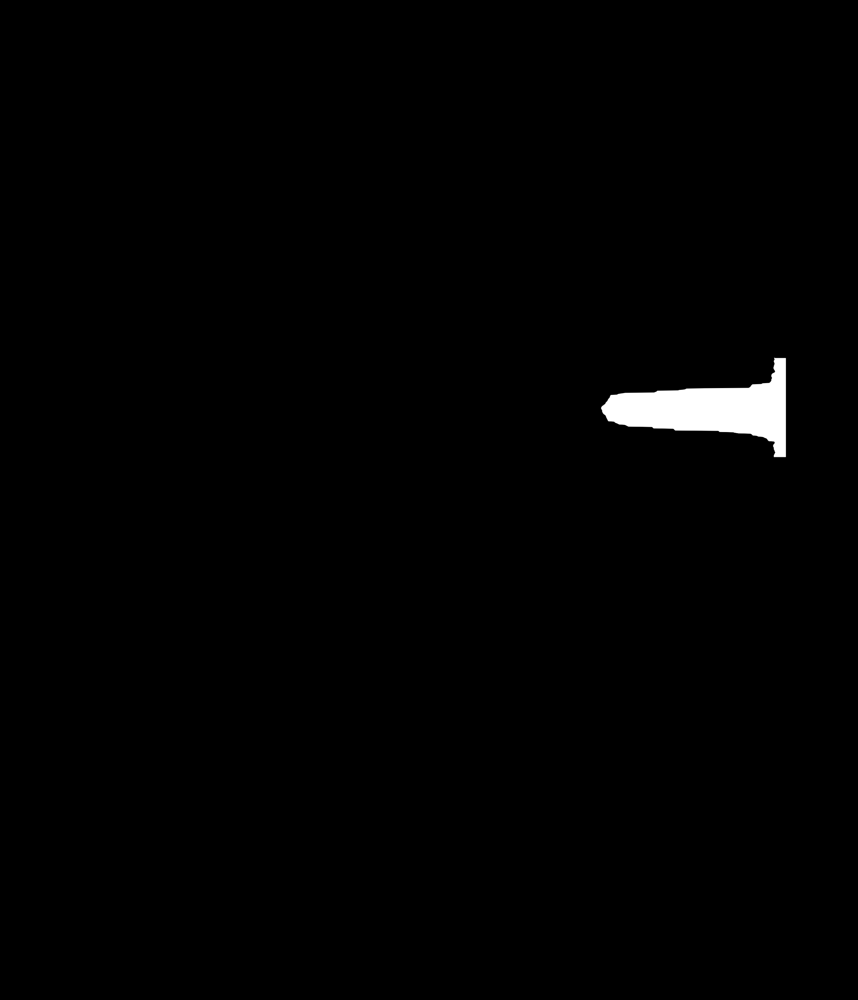

In [20]:
plt.figure(figsize=(2400/96, 2800/96), dpi=96)
#plt.figure(figsize=(5,4))
plt.style.use('dark_background')
plt.axes([0,0,1,1], frameon=False)
plt.plot(leaf[:,1], leaf[:,0]+1000, c='w', alpha=1)
plt.fill_betweenx(leaf[:,0]+1000, leaf[:,1],x2=2205,color='w',alpha=1)
fig = plt.imshow(image, cmap="gray", alpha=0)
plt.ylim(2800,0)
plt.xlim(0,2400)
plt.box(False)
fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)
#plt.savefig("mask_only.tiff")
#plt.savefig("try_smaller_{}.tiff".format(leaf_position))


In [63]:
matplotlib.rcdefaults() 

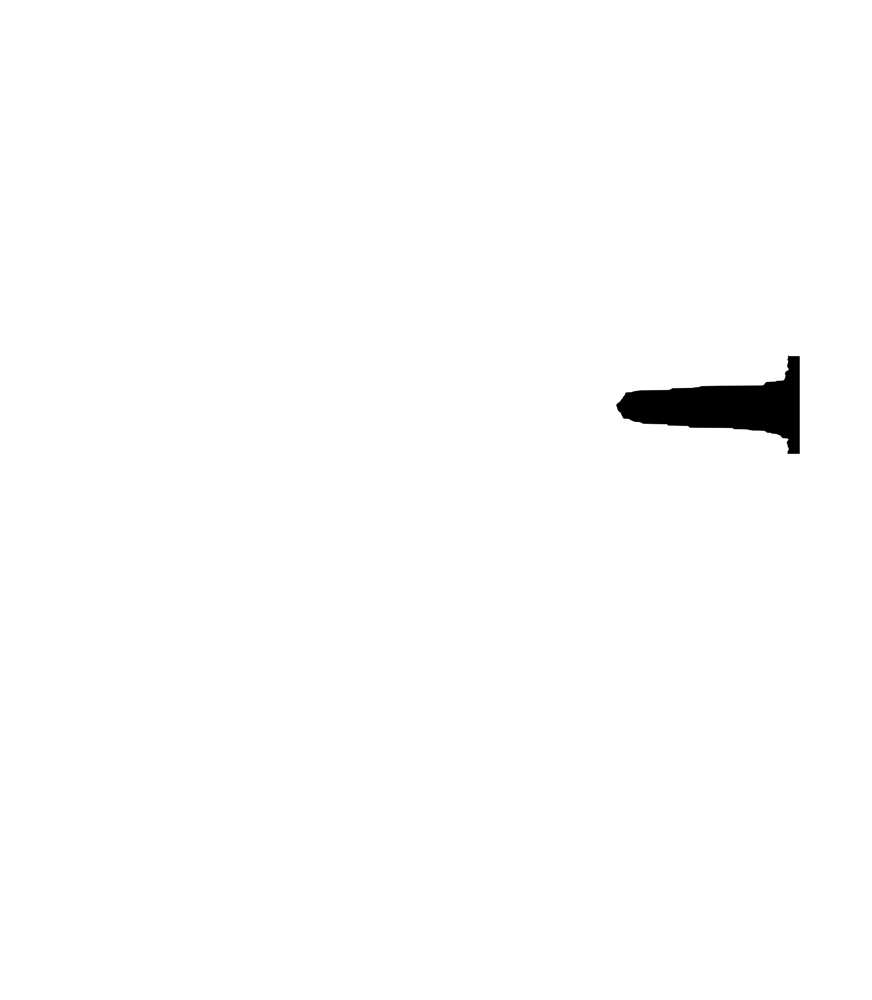

In [66]:
plt.figure(figsize=(2400/96, 2800/96), dpi=96)
plt.plot(leaf[:,1], leaf[:,0]+1000, c='k')
plt.fill_betweenx(leaf[:,0]+1000, leaf[:,1],x2=2205,color='k', cmap='gray')
plt.ylim(2800,0)
plt.xlim(0,2400)
plt.box(False)
plt.axis('off')
plt.savefig("hhh.png")

In [67]:
from matplotlib.image import imread

In [68]:
test = imread("hhh.png")

In [69]:
test.shape

(2800, 2400, 4)

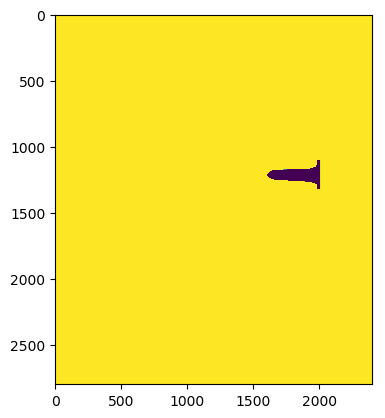

In [70]:
plt.imshow(test[...,0])

In [38]:
plt.savefig?

Signature: plt.savefig(*args, **kwargs)
Docstring:
Save the current figure.

Call signature::

  savefig(fname, dpi=None, facecolor='w', edgecolor='w',
          orientation='portrait', papertype=None, format=None,
          transparent=False, bbox_inches=None, pad_inches=0.1,
          frameon=None, metadata=None)

The output formats available depend on the backend being used.

Parameters
----------

fname : str or file-like object
    A string containing a path to a filename, or a Python
    file-like object, or possibly some backend-dependent object
    such as :class:`~matplotlib.backends.backend_pdf.PdfPages`.

    If *format* is *None* and *fname* is a string, the output
    format is deduced from the extension of the filename. If
    the filename has no extension, :rc:`savefig.format` is used.

    If *fname* is not a string, remember to specify *format* to
    ensure that the correct backend is used.

Other Parameters
----------------

dpi : [ *None* | scalar > 0 | 'figure' ]
 

In [80]:
ls1b

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 0, ..., 0, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]])

In [84]:
np.unique(ls1b)

array([0, 1])

In [81]:
ls1b.shape

(2800, 2400)

In [85]:
ls1b.dtype

dtype('int64')

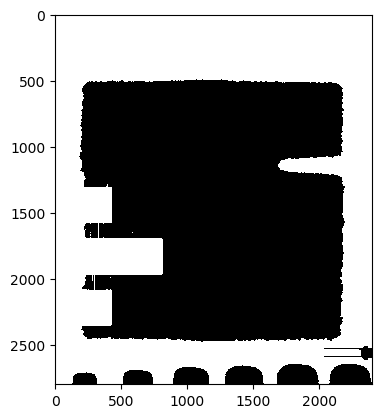

In [87]:
plt.imshow(ls1,cmap='gray')

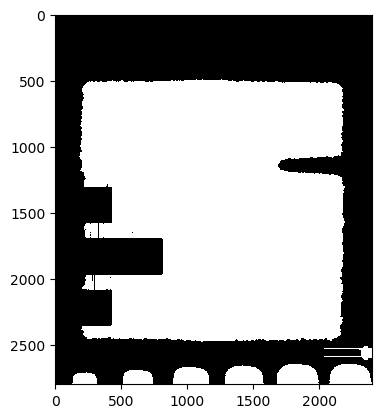

In [83]:
plt.imshow(ls1b,cmap='gray')

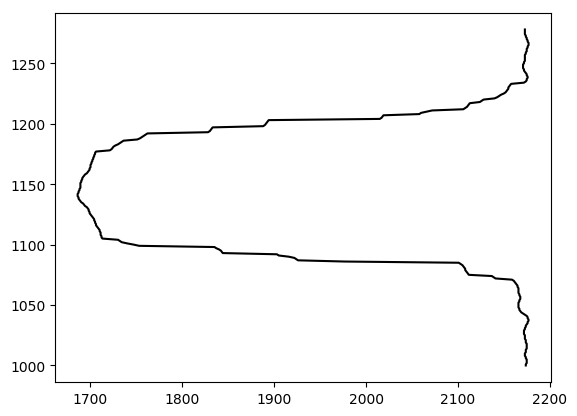

In [112]:
lines = plt.plot(leaf[:,1], leaf[:,0]+1000, c='k')

In [131]:
x = lines[0].get_xdata(orig=False)
y = lines[0].get_ydata(orig=False)

In [136]:
path = lines[0].get_path()

In [145]:
g = path.iter_segments()

In [156]:
l= list(path.iter_segments())

In [159]:
l

[(array([2174., 1000.]), 1),
 (array([2174., 1001.]), 2),
 (array([2175., 1002.]), 2),
 (array([2175., 1005.]), 2),
 (array([2174., 1006.]), 2),
 (array([2174., 1007.]), 2),
 (array([2173., 1008.]), 2),
 (array([2173., 1010.]), 2),
 (array([2174., 1011.]), 2),
 (array([2174., 1013.]), 2),
 (array([2175., 1014.]), 2),
 (array([2175., 1018.]), 2),
 (array([2174., 1019.]), 2),
 (array([2174., 1021.]), 2),
 (array([2173., 1022.]), 2),
 (array([2173., 1025.]), 2),
 (array([2172., 1026.]), 2),
 (array([2172., 1029.]), 2),
 (array([2173., 1030.]), 2),
 (array([2173., 1031.]), 2),
 (array([2174., 1032.]), 2),
 (array([2174., 1033.]), 2),
 (array([2176., 1035.]), 2),
 (array([2176., 1036.]), 2),
 (array([2177., 1037.]), 2),
 (array([2177., 1038.]), 2),
 (array([2176., 1039.]), 2),
 (array([2176., 1040.]), 2),
 (array([2175., 1041.]), 2),
 (array([2169., 1044.]), 2),
 (array([2167., 1046.]), 2),
 (array([2167., 1047.]), 2),
 (array([2166., 1048.]), 2),
 (array([2166., 1052.]), 2),
 (array([2167.

In [160]:
coords=[(a[0],a[1]) for a,_ in l]

In [162]:
x = np.asarray([cx for cx,_ in coords],dtype=int)

In [165]:
y = np.asarray([cy for _,cy in coords],dtype=int)

In [133]:
y.shape

(279,)

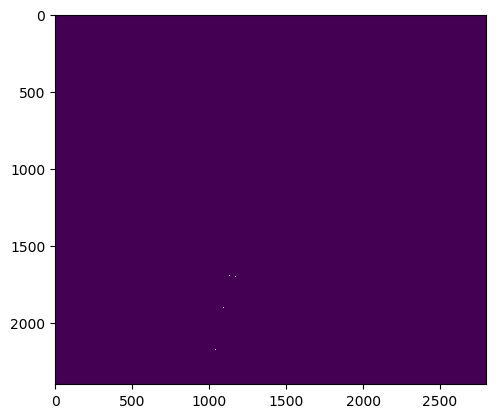

In [167]:
r = np.zeros(shape=(2400,2800))
r[x,y]=1
plt.imshow(r)

In [78]:
((start  <= r) & (r <= end)).astype(int)

ValueError: operands could not be broadcast together with shapes (279,) (2400,2800) 